In [1]:
#import necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy
import sklearn
import warnings
warnings.filterwarnings("ignore")

In [2]:
#importing the dataset
df=pd.read_csv("weather.csv")
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [3]:
print("The shape of the dataset is",df.shape)

The shape of the dataset is (8425, 23)


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

Here we can see the date column is as object data type, lets change it to datetime format to proceed further.

In [5]:
df['Date']=pd.to_datetime(df['Date'])
df['Date'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 8425 entries, 0 to 8424
Series name: Date
Non-Null Count  Dtype         
--------------  -----         
8425 non-null   datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 65.9 KB


Now we can see the data type is changed to datetime.

In [6]:
df.head(2)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No


In [7]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,8350.000000,8365.000000,8185.000000,4913.000000,4431.000000,7434.000000,8349.000000,8318.000000,8366.000000,8323.000000,7116.000000,7113.000000,6004.000000,5970.000000,8369.000000,8329.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934
std,5.403596,6.136408,10.459379,5.044484,3.896235,14.665721,10.174579,9.766986,16.833283,18.423774,6.828699,6.766681,2.877658,2.731659,5.627035,5.980020
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.200000,19.300000,0.000000,2.600000,4.750000,30.000000,6.000000,11.000000,56.000000,39.000000,1013.000000,1010.400000,1.000000,2.000000,13.800000,18.000000
50%,13.300000,23.300000,0.000000,4.600000,8.700000,39.000000,13.000000,19.000000,68.000000,51.000000,1017.700000,1015.300000,5.000000,5.000000,17.800000,21.900000
75%,17.400000,28.000000,1.000000,7.000000,10.700000,50.000000,20.000000,24.000000,80.000000,63.000000,1022.300000,1019.800000,7.000000,7.000000,21.900000,26.400000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


In [8]:
df.describe(include="O")

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
count,8425,7434,7596,8117,8185,8186
unique,12,16,16,16,2,2
top,Melbourne,N,N,SE,No,No
freq,1622,713,906,813,6195,6195


In [9]:
#checking null values
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

There are lots of null values present in the dataset.

In [10]:
df.isnull().sum().sum()

19472

In [11]:
df.size

193775

<AxesSubplot:>

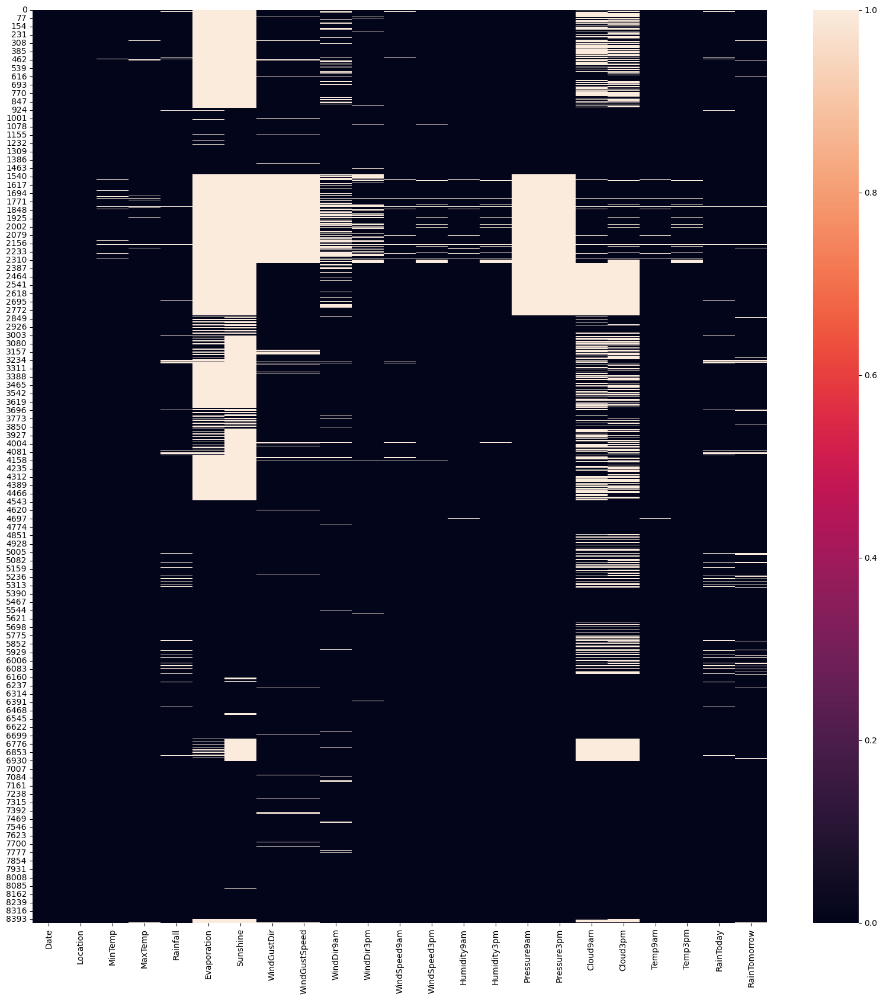

In [12]:
plt.figure(figsize=(20,20))
sns.heatmap(df.isnull())

As the null values are more lets remove them using SimpleImputer.

In [13]:
#separating categorical and numerical columns
cat_col=[]
num_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        cat_col.append(i)
    else:
        num_col.append(i)
print("Categorical columns\n",cat_col)
print("\n")
print("Numerical Columns\n",num_col)

Categorical columns
 ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


Numerical Columns
 ['Date', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


In [14]:
from sklearn.impute import SimpleImputer

In [15]:
#Lets replace the nan values in cat columns with mode
for i in cat_col:
    df[i]=SimpleImputer(missing_values=np.nan,strategy='most_frequent').fit_transform(df[i].values.reshape(-1,1))

In [16]:
#Replacing nan values from num col
#Lets first drop the date column from num_col
num_col.remove('Date')
print('Num Column\n',num_col)

Num Column
 ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


In [17]:
for i in num_col:
    df[i]=SimpleImputer(missing_values=np.nan,strategy='mean').fit_transform(df[i].values.reshape(-1,1))

In [18]:
#Lets check if any null values are present or not
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

There are no null values in the dataset.

In [19]:
#checking duplicate values
df.duplicated().sum()

1663

There are duplicate values in the dataset, it will give a wrong prediction if we continue with these values, lets remove them.

In [20]:
#Removing duplicate values but keeping the first occurence as we may loose some important data if we drop them completely
df.drop_duplicates(keep='first',inplace=True)

In [21]:
df.duplicated().sum()

0

Now we are having a dataset free of any null and duplicate values.

# Unique_Values

In [22]:
for i in cat_col:
    print(df[i].value_counts())
    print("\n")

PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: Location, dtype: int64


N      1401
E       518
SW      465
W       434
WSW     420
WNW     398
SSE     390
S       376
SE      370
ENE     357
NE      300
SSW     299
NW      296
NNE     287
ESE     267
NNW     184
Name: WindGustDir, dtype: int64


N      1403
SW      590
NW      463
SE      439
ENE     397
WSW     394
SSW     368
NE      364
E       338
NNE     337
S       324
WNW     301
SSE     300
W       299
ESE     229
NNW     216
Name: WindDir9am, dtype: int64


SE     971
WSW    499
S      493
NE     480
SW     428
SSE    421
NW     400
W      399
E      392
WNW    389
ESE    363
N      354
ENE    348
NNE    305
SSW    277
NNW    243
Name: WindDir3pm, dtype: int64


No     5190
Yes    1572
Name: RainToday, dtype: int64


N

# Visulization

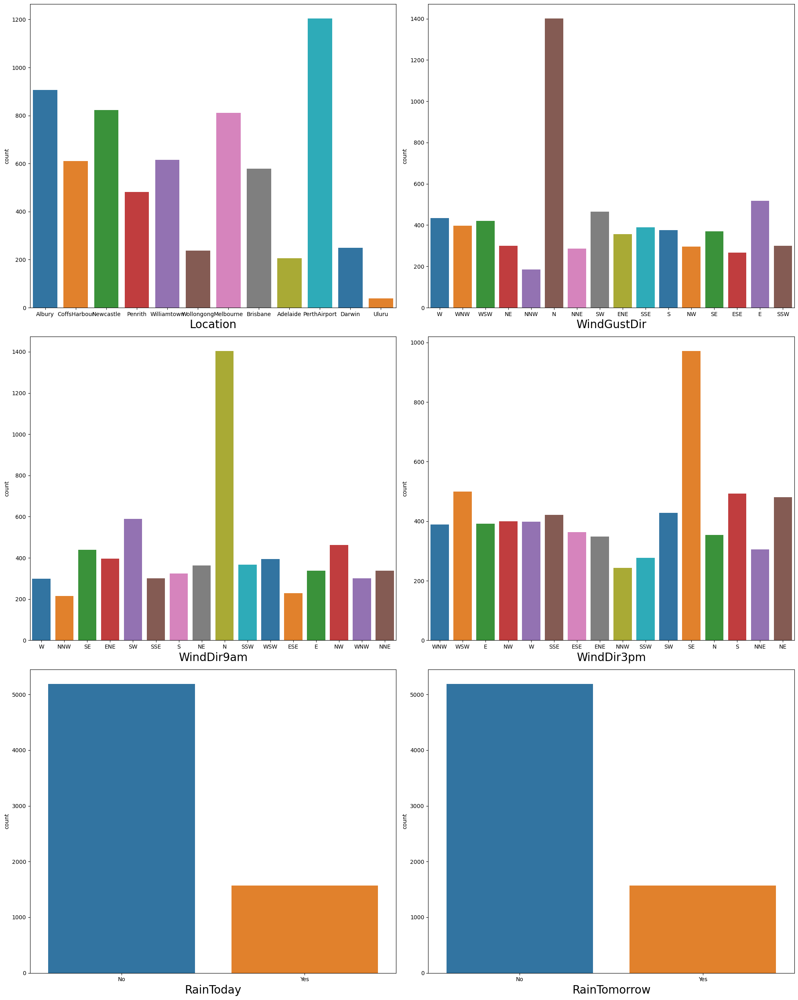

In [23]:
plt.figure(figsize=(20,25))
p=1
for i in cat_col:
    if p<=6:
        plt.subplot(3,2,p)
        sns.countplot(df[i],palette='tab10')
        plt.xlabel(i,fontsize=20)
    p+=1
plt.tight_layout()

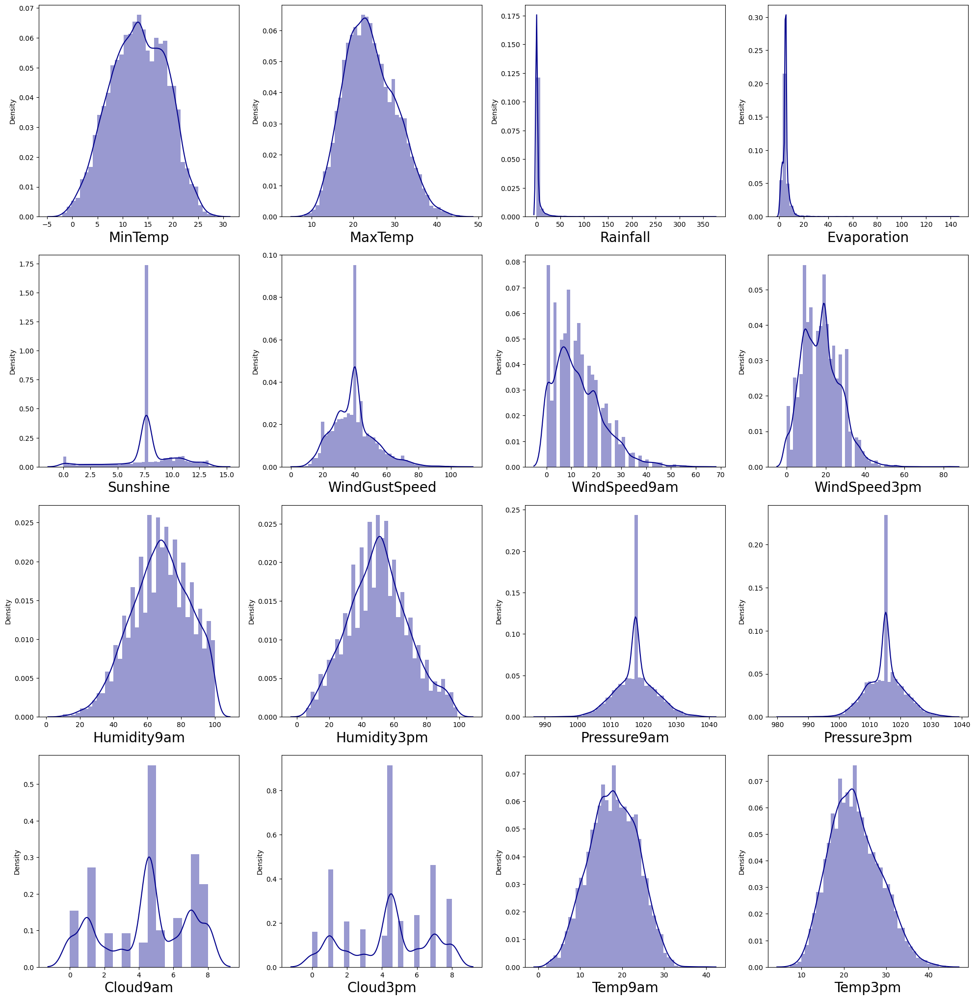

In [24]:
plt.figure(figsize=(20,25))
p=1
for i in num_col:
    if p<=20:
        plt.subplot(5,4,p)
        sns.distplot(df[i],color='darkblue')
        plt.xlabel(i,fontsize=20)
    p+=1
plt.tight_layout()

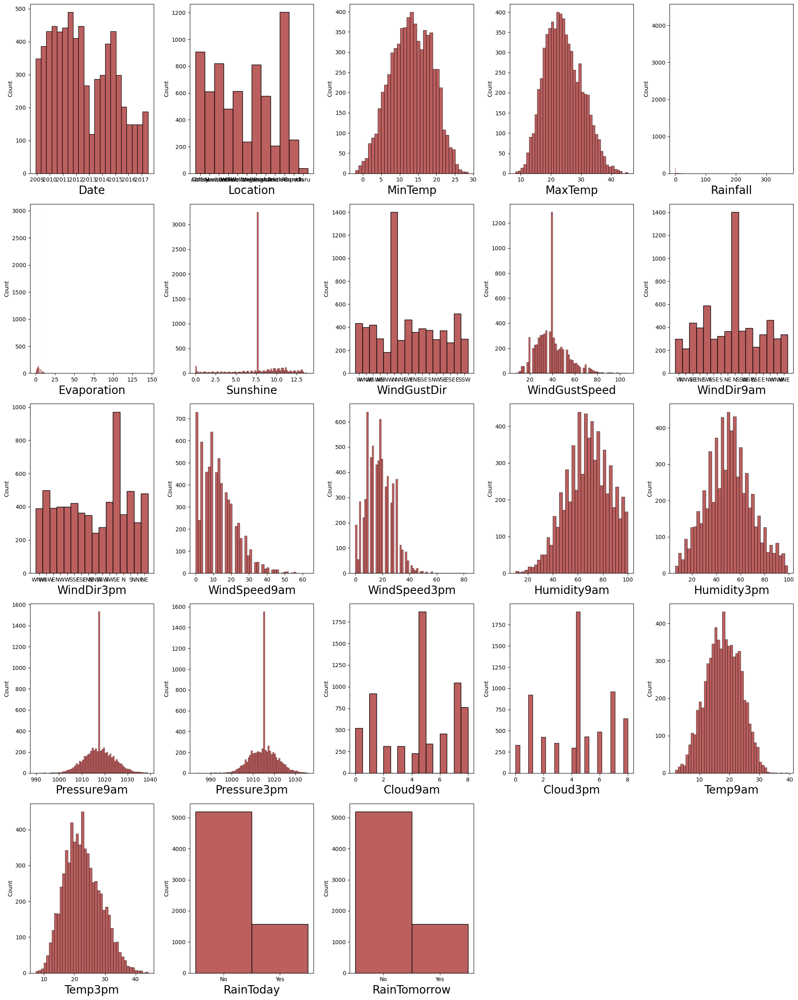

In [25]:
plt.figure(figsize=(20,25))
p=1
for i in df:
    if p<=23:
        plt.subplot(5,5,p)
        sns.histplot(df[i],color='brown')
        plt.xlabel(i,fontsize=20)
    p+=1
plt.tight_layout()

<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

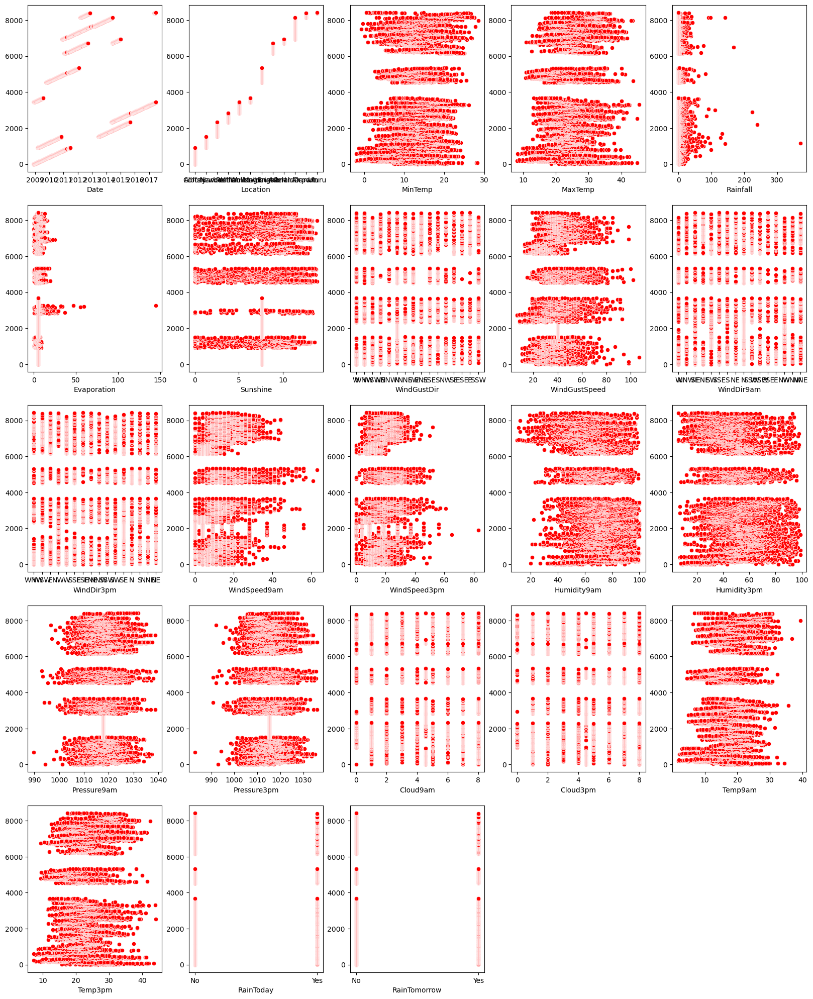

In [26]:
plt.figure(figsize=(20,25))
p=1
for i in df:
    if p<=23:
        plt.subplot(5,5,p)
        sns.scatterplot(x=df[i],y=df.index,color='red')
    p+=1
plt.tight_layout

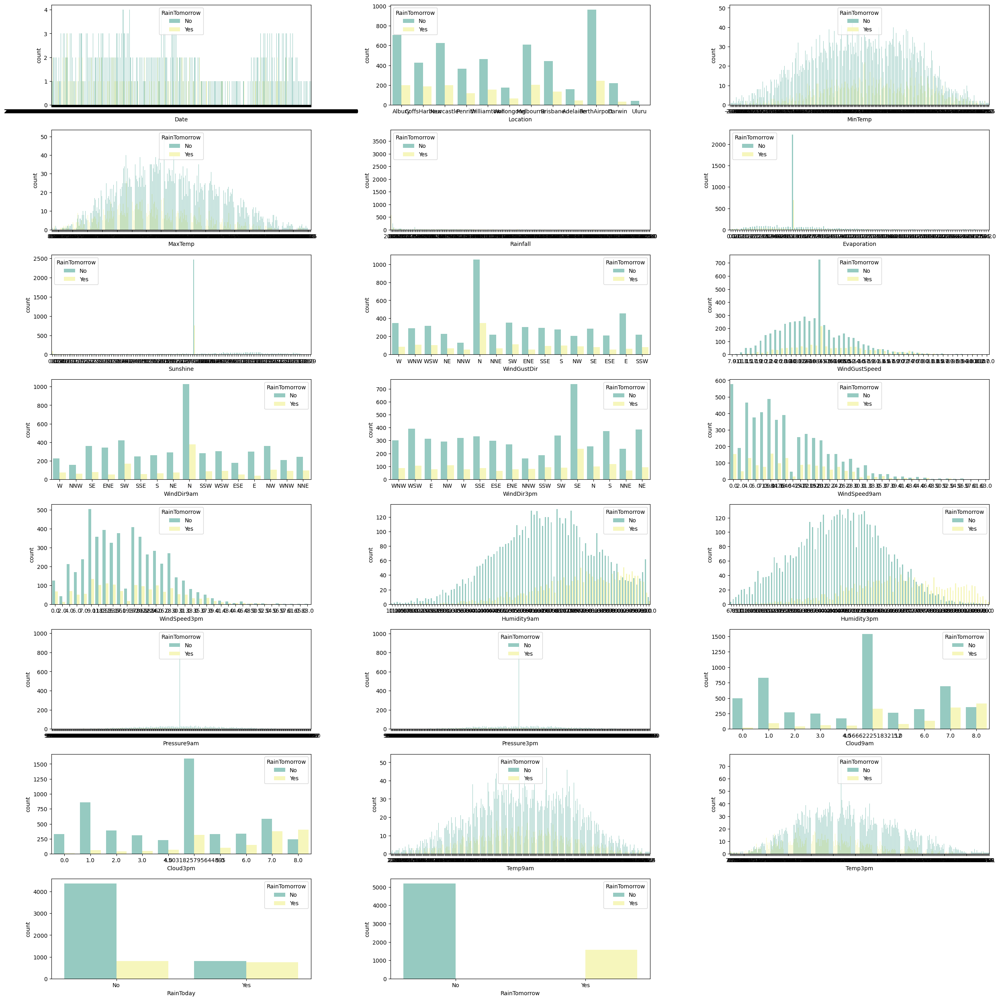

In [27]:
plt.figure(figsize=(25,25))
p=1
for i in df:
    if p<=23:
        plt.subplot(8,3,p)
        sns.countplot(hue=df.RainTomorrow,x=df[i],palette='Set3')
    p+=1
plt.tight_layout()

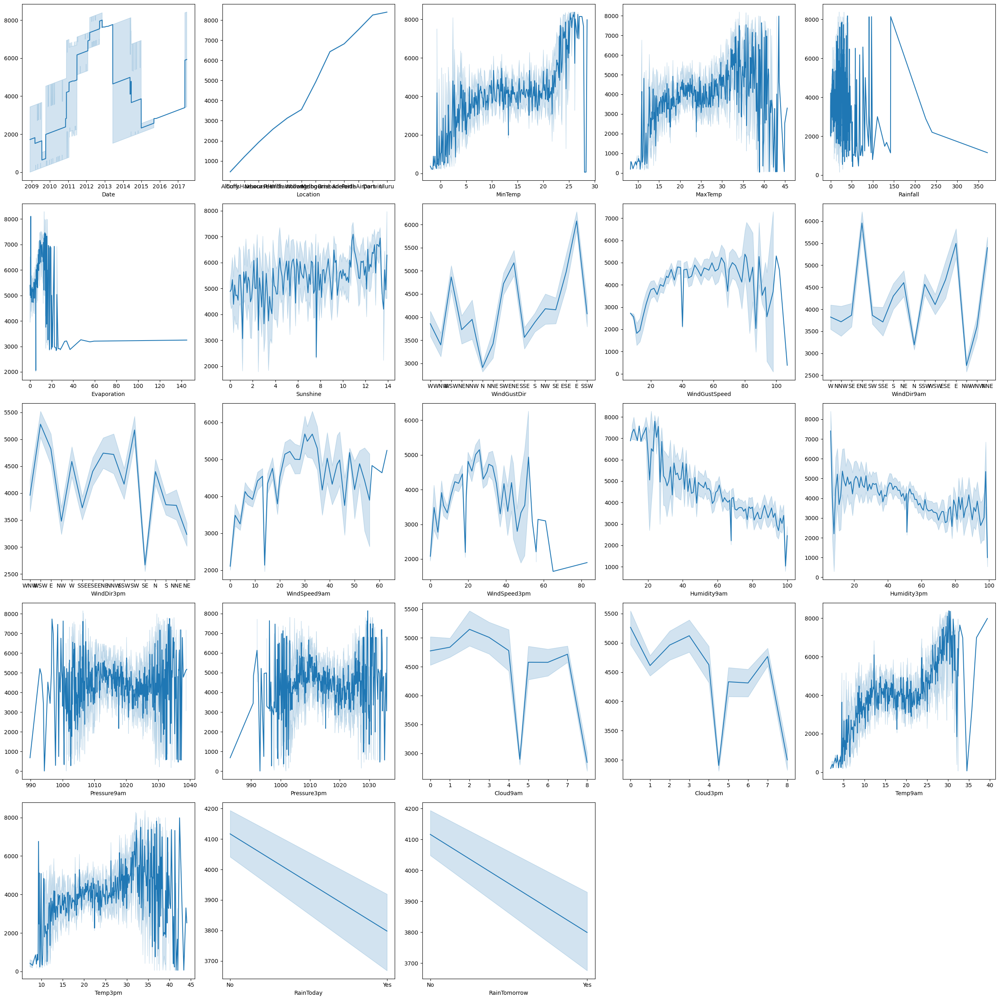

In [28]:
plt.figure(figsize=(25,25))
p=1
for i in df:
    if p<=23:
        plt.subplot(5,5,p)
        sns.lineplot(x=df[i],y=df.index,palette='Dark2')
    p+=1
plt.tight_layout()

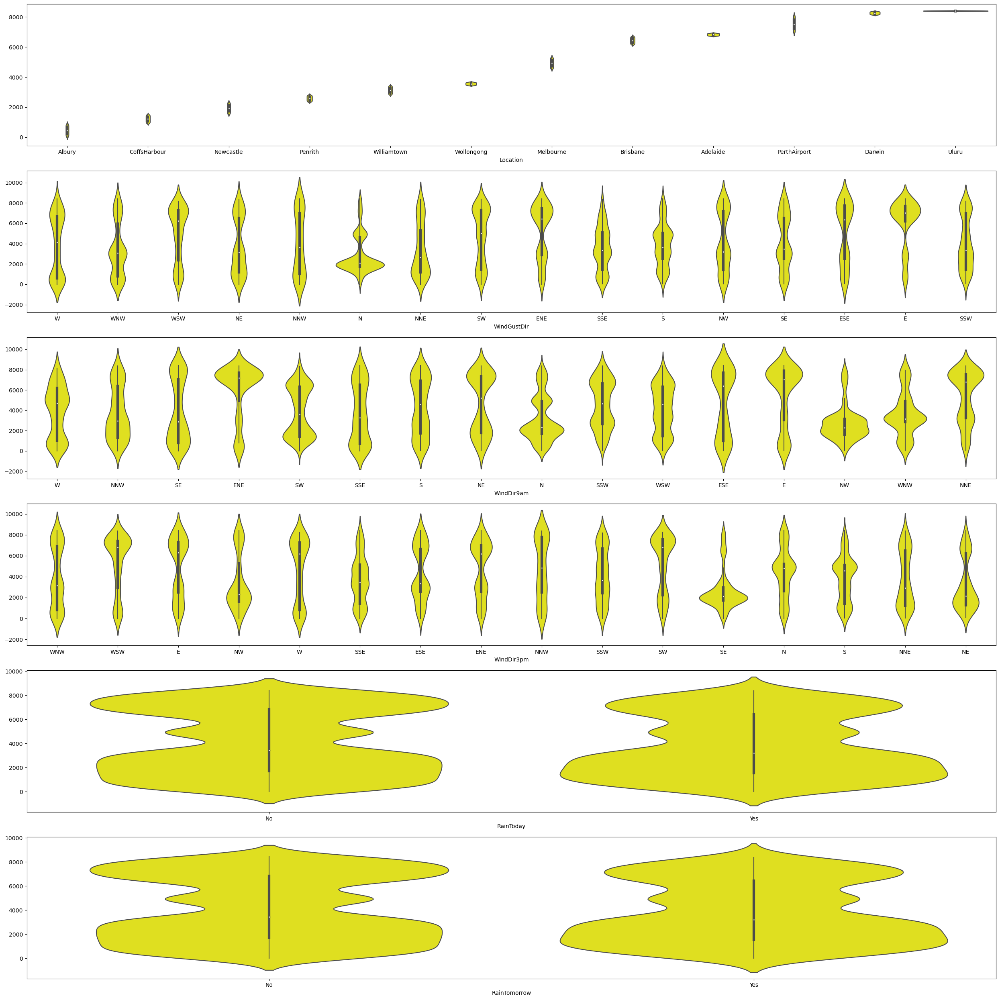

In [29]:
plt.figure(figsize=(25,25))
p=1
for i in cat_col:
    if p<=6:
        plt.subplot(6,1,p)
        sns.violinplot(x=df[i],y=df.index,color='yellow')
    p+=1
plt.tight_layout()

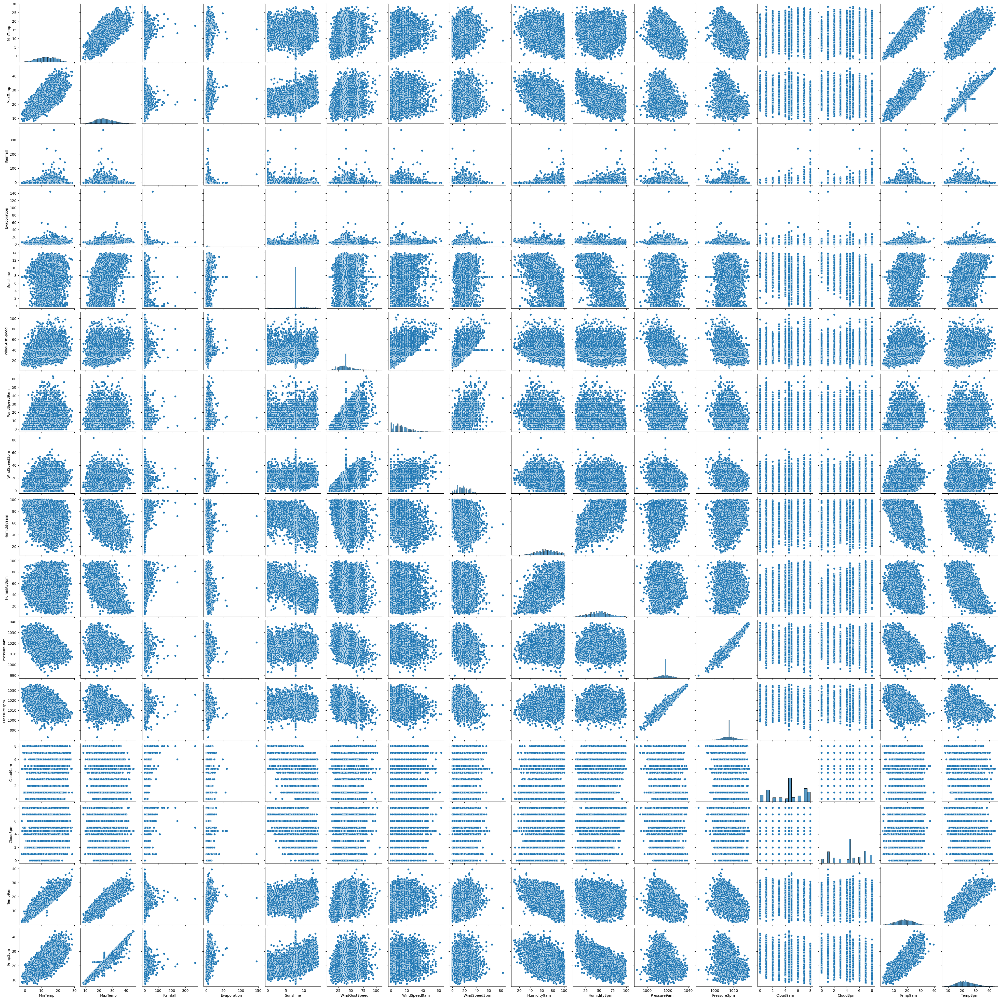

In [30]:
sns.pairplot(data=df)

# Outliers

In [31]:
print(num_col)

['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


In [32]:
from scipy.stats import zscore

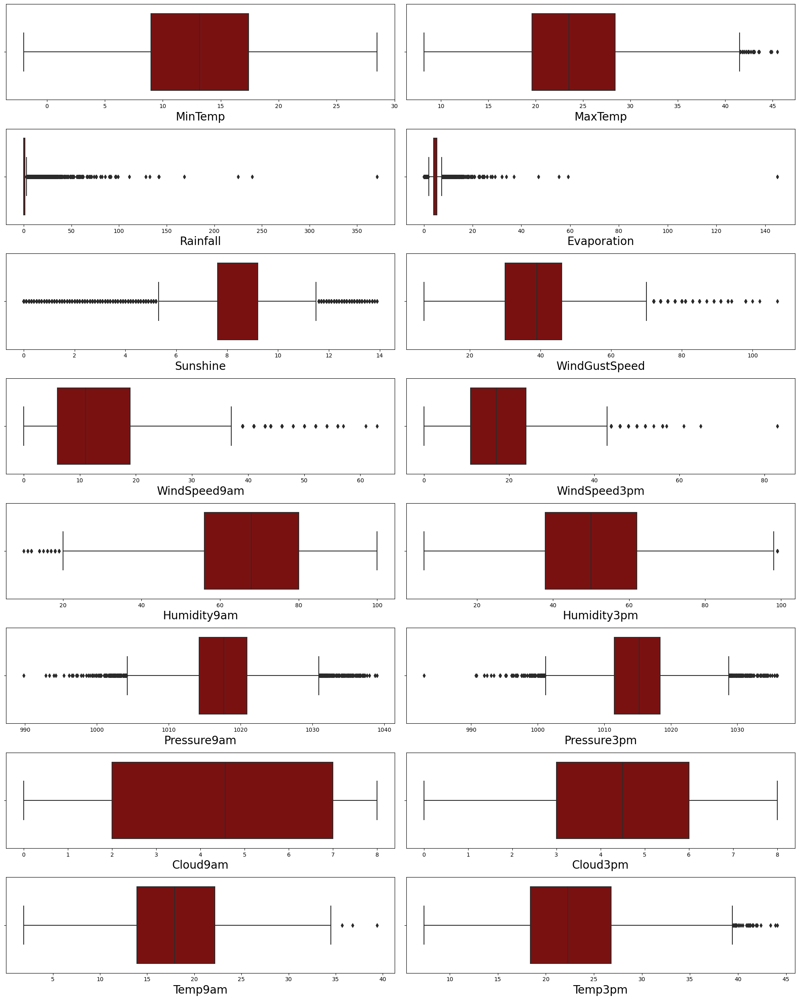

In [33]:
#visualizing num_col for presence of any outliers
plt.figure(figsize=(20,25))
p=1
for i in num_col:
    if p<=16:
        plt.subplot(8,2,p)
        sns.boxplot(df[i],color='darkred')
        plt.xlabel(i,fontsize=20)
    p+=1
plt.tight_layout()

In [34]:
#As Rainfall column is the target variable we will not remove any outliers from it
outliers=df[['MaxTemp','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Pressure9am',
            'Pressure3pm','Temp9am','Temp3pm']]
z=np.abs(zscore(outliers))
z

,MaxTemp,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Pressure9am,Pressure3pm,Temp9am,Temp3pm
0,0.195170,0.014779,0.049294,0.362850,0.736444,0.671784,0.203179,1.647292,1.347736,0.173722,0.151545
1,0.163738,0.014779,0.049294,0.362850,0.898312,0.462330,1.368283,1.166162,1.230431,0.121292,0.267112
2,0.261622,0.014779,0.049294,0.512305,0.634272,0.881238,1.717496,1.663883,1.079611,0.542811,0.082903
3,0.636844,0.014779,0.049294,1.131708,0.183106,0.899122,1.310080,0.004812,0.392542,0.035995,0.635529
4,1.338345,0.014779,0.049294,0.138666,0.591796,0.252876,0.843405,1.132980,1.532071,0.016434,1.171410
...,...,...,...,...,...,...,...,...,...,...,...
8420,0.113600,0.014779,0.049294,0.608613,0.021238,0.689668,0.960867,1.156538,0.864293,1.362117,0.051067
8421,0.196366,0.014779,0.049294,1.281164,0.021238,0.899122,0.669855,0.974040,0.663199,1.222306,0.300604
8422,0.457390,0.014779,0.049294,0.160246,0.387451,0.899122,0.844462,0.559272,0.277770,0.942683,0.568544
8423,0.473704,0.014779,0.049294,0.832796,0.021238,1.108576,0.960867,0.293821,0.227497,0.488297,0.551798


In [35]:
threshold=3
print(np.where(z>3))

(array([   8,   12,   12,   44,   44,   52,   52,   60,   60,   61,   61,
         62,   62,   62,   67,   68,   68,  123,  267,  271,  296,  381,
        381,  405,  406,  407,  466,  466,  563,  567,  568,  568,  569,
        602,  602,  603,  683,  683,  748,  748,  795,  928,  980,  980,
       1189, 1535, 1587, 1644, 1665, 1898, 1903, 1945, 2016, 2028, 2043,
       2074, 2186, 2219, 2219, 2230, 2500, 2505, 2527, 2527, 2827, 2835,
       2849, 2855, 2859, 2863, 2869, 2877, 2883, 2891, 2897, 2900, 2905,
       2911, 2919, 2925, 2933, 2939, 2947, 2953, 2961, 2967, 2975, 2989,
       3027, 3045, 3051, 3055, 3058, 3059, 3059, 3060, 3066, 3067, 3067,
       3067, 3068, 3070, 3082, 3082, 3082, 3089, 3089, 3099, 3099, 3101,
       3141, 3143, 3150, 3153, 3153, 3157, 3157, 3164, 3167, 3169, 3172,
       3172, 3178, 3185, 3192, 3206, 3212, 3212, 3212, 3213, 3221, 3227,
       3234, 3248, 3256, 3260, 3278, 3278, 3280, 3291, 3302, 3302, 3303,
       3360, 3446, 3449, 3449, 3449, 3450, 3450, 3

In [36]:
df_new=df[(z<3).all(axis=1)]
df_new

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.000000,0.0,5.389395,7.632205,SE,28.000000,SSE,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,No,No


In [37]:
print("Data Loss after removing outliers =",(df.shape[0]-df_new.shape[0])/df.shape[0]*100)

Data Loss after removing outliers = 3.9781129843241643


As the dataloss is only 3.97% we can continue with the new dataset.

In [38]:
df=df_new
df.shape

(6493, 23)

# Skewness

In [39]:
df.skew()

MinTemp          -0.089051
MaxTemp           0.274453
Rainfall         14.239631
Evaporation       0.663913
Sunshine         -0.757206
WindGustSpeed     0.434741
WindSpeed9am      0.672929
WindSpeed3pm      0.337061
Humidity9am      -0.239570
Humidity3pm       0.154838
Pressure9am       0.065782
Pressure3pm       0.079656
Cloud9am         -0.287306
Cloud3pm         -0.219786
Temp9am          -0.071891
Temp3pm           0.299371
dtype: float64

Dataset is not having much skewness, only Rainfall column is having skewness and as it is the target variable we can't remove skewness from this column.

# Encoding

In [40]:
from sklearn.preprocessing import LabelEncoder

In [41]:
le=LabelEncoder()
for i in cat_col:
    df[i]=le.fit_transform(df[i])

In [42]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,1,13.4,22.9,0.6,5.389395,7.632205,13,44.0,13,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0,0
1,2008-12-02,1,7.4,25.1,0.0,5.389395,7.632205,14,44.0,6,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0,0
2,2008-12-03,1,12.9,25.7,0.0,5.389395,7.632205,15,46.0,13,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0,0
3,2008-12-04,1,9.2,28.0,0.0,5.389395,7.632205,4,24.0,9,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0,0
4,2008-12-05,1,17.5,32.3,1.0,5.389395,7.632205,13,41.0,1,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0


# Feature Scaling

In [43]:
from sklearn.preprocessing import StandardScaler

In [44]:
df_scaled=df.copy()         #Storing the main dataframe

In [45]:
num_col.remove('Rainfall')    #Removing the target column 

In [46]:
features=df_scaled[num_col]

In [47]:
#Scaling the features
st=StandardScaler()
df_scaled[num_col]=st.fit_transform(features.values)

In [48]:
df_scaled.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,1,0.062237,-0.187334,0.6,0.110387,-0.053366,13,0.463334,13,...,0.186193,-1.564740,-1.759024,-1.442730,1.452768,0.063442,-0.164266,-0.145334,0,0
1,2008-12-02,1,-1.023016,0.178948,0.0,0.110387,-0.053366,14,0.463334,6,...,-1.404255,-1.401063,-1.252040,-1.319174,0.069481,0.063442,-0.111321,0.281855,0,0
2,2008-12-03,1,-0.028201,0.278844,0.0,0.110387,-0.053366,15,0.626293,13,...,-1.757688,-1.128268,-1.776507,-1.160316,0.069481,-1.012435,0.559309,0.093892,0,0
3,2008-12-04,1,-0.697440,0.661776,0.0,0.110387,-0.053366,4,-1.166250,9,...,-1.345350,-1.892095,-0.028286,-0.436633,0.069481,0.063442,0.047512,0.657781,0,0
4,2008-12-05,1,0.803827,1.377692,1.0,0.110387,-0.053366,13,0.218897,1,...,0.834154,-0.964591,-1.217076,-1.636889,1.049874,1.566388,-0.005432,1.204583,0,0


Now we can see all our numerical columns are scaled.

In [49]:
df=df_scaled
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,1,0.062237,-0.187334,0.6,0.110387,-0.053366,13,0.463334,13,...,0.186193,-1.564740,-1.759024,-1.442730,1.452768,0.063442,-0.164266,-0.145334,0,0
1,2008-12-02,1,-1.023016,0.178948,0.0,0.110387,-0.053366,14,0.463334,6,...,-1.404255,-1.401063,-1.252040,-1.319174,0.069481,0.063442,-0.111321,0.281855,0,0
2,2008-12-03,1,-0.028201,0.278844,0.0,0.110387,-0.053366,15,0.626293,13,...,-1.757688,-1.128268,-1.776507,-1.160316,0.069481,-1.012435,0.559309,0.093892,0,0
3,2008-12-04,1,-0.697440,0.661776,0.0,0.110387,-0.053366,4,-1.166250,9,...,-1.345350,-1.892095,-0.028286,-0.436633,0.069481,0.063442,0.047512,0.657781,0,0
4,2008-12-05,1,0.803827,1.377692,1.0,0.110387,-0.053366,13,0.218897,1,...,0.834154,-0.964591,-1.217076,-1.636889,1.049874,1.566388,-0.005432,1.204583,0,0


In [50]:
#Separating target and feature columns
x=df.iloc[:,[0,1,2,3,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21]]
x.head()

,Date,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,2008-12-01,1,0.062237,-0.187334,0.110387,-0.053366,13,0.463334,13,14,...,0.754321,0.186193,-1.564740,-1.759024,-1.442730,1.452768,0.063442,-0.164266,-0.145334,0
1,2008-12-02,1,-1.023016,0.178948,0.110387,-0.053366,14,0.463334,6,15,...,0.533938,-1.404255,-1.401063,-1.252040,-1.319174,0.069481,0.063442,-0.111321,0.281855,0
2,2008-12-03,1,-0.028201,0.278844,0.110387,-0.053366,15,0.626293,13,15,...,0.974704,-1.757688,-1.128268,-1.776507,-1.160316,0.069481,-1.012435,0.559309,0.093892,0
3,2008-12-04,1,-0.697440,0.661776,0.110387,-0.053366,4,-1.166250,9,0,...,-0.898550,-1.345350,-1.892095,-0.028286,-0.436633,0.069481,0.063442,0.047512,0.657781,0
4,2008-12-05,1,0.803827,1.377692,0.110387,-0.053366,13,0.218897,1,7,...,0.313555,0.834154,-0.964591,-1.217076,-1.636889,1.049874,1.566388,-0.005432,1.204583,0


In [51]:
y1=df['Rainfall']
y1.head()

0    0.6
1    0.0
2    0.0
3    0.0
4    1.0
Name: Rainfall, dtype: float64

In [52]:
y2=df['RainTomorrow']
y2.head()

0    0
1    0
2    0
3    0
4    0
Name: RainTomorrow, dtype: int32

# Multi-Collinearity

In [53]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [54]:
x.drop('Date',axis=1,inplace=True)    #As we cannot take datetime data type for vif

In [55]:
vif=pd.DataFrame()
vif['VIF_Values']=[variance_inflation_factor(x.values,i)for i in range(len(x.columns))]
vif['Features']=x.columns
vif

,VIF_Values,Features
0,2.915894,Location
1,8.989456,MinTemp
2,26.329497,MaxTemp
3,1.580075,Evaporation
4,2.033065,Sunshine
5,4.925343,WindGustDir
6,2.172985,WindGustSpeed
7,3.806194,WindDir9am
8,5.109448,WindDir3pm
9,1.961066,WindSpeed9am


We can see there is multi_collinearity present in certain columns, lets remove them.

In [56]:
x.drop(['MaxTemp','Pressure9am','Pressure3pm','Temp3pm'],axis=1,inplace=True)

In [57]:
x.drop('Temp9am',axis=1,inplace=True)

In [58]:
x.head()

,Location,MinTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,RainToday
0,1,0.062237,0.110387,-0.053366,13,0.463334,13,14,0.860772,0.754321,0.186193,-1.564740,1.452768,0.063442,0
1,1,-1.023016,0.110387,-0.053366,14,0.463334,6,15,-0.912627,0.533938,-1.404255,-1.401063,0.069481,0.063442,0
2,1,-0.028201,0.110387,-0.053366,15,0.626293,13,15,0.749935,0.974704,-1.757688,-1.128268,0.069481,-1.012435,0
3,1,-0.697440,0.110387,-0.053366,4,-1.166250,9,0,-0.136765,-0.898550,-1.345350,-1.892095,0.069481,0.063442,0
4,1,0.803827,0.110387,-0.053366,13,0.218897,1,7,-0.580114,0.313555,0.834154,-0.964591,1.049874,1.566388,0


# Classification Modelling ("Rain Tomorrow")

In [59]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB

In [60]:
x_train,x_test,y2_train,y2_test=train_test_split(x,y2,test_size=0.33,random_state=42)

In [61]:
rfc=RandomForestClassifier()
rfc.fit(x_train,y2_train)
rfc_pred=rfc.predict(x_test)
print("Accuracy Score =",accuracy_score(y2_test,rfc_pred))

Accuracy Score = 0.8413439104059729


In [62]:
dtc=DecisionTreeClassifier()
dtc.fit(x_train,y2_train)
dtc_pred=dtc.predict(x_test)
print("Accuracy Score =",accuracy_score(y2_test,dtc_pred))

Accuracy Score = 0.7643490433971069


In [63]:
gnb=GaussianNB()
gnb.fit(x_train,y2_train)
gnb_pred=gnb.predict(x_test)
print("Accuracy Score =",accuracy_score(y2_test,gnb_pred))

Accuracy Score = 0.8114792347176855


In [64]:
lr=LogisticRegression()
lr.fit(x_train,y2_train)
lr_pred=lr.predict(x_test)
print("Accuracy Score =",accuracy_score(y2_test,lr_pred))

Accuracy Score = 0.8422771815212319


In [65]:
knn=KNeighborsClassifier()
knn.fit(x_train,y2_train)
knn_pred=knn.predict(x_test)
print("Accuracy Score =",accuracy_score(y2_test,knn_pred))

Accuracy Score = 0.810079328044797


# Cross_Validation

In [66]:
from sklearn.model_selection import cross_val_score

In [67]:
for i in range(2,25):
    score=cross_val_score(dtc,x,y2,cv=i)
    print("At K-fold",i,"cv score is",score.mean())

At K-fold 2 cv score is 0.6893650444858243
At K-fold 3 cv score is 0.7147775410916117
At K-fold 4 cv score is 0.7001344398107258
At K-fold 5 cv score is 0.7109256735357647
At K-fold 6 cv score is 0.7070564581509226
At K-fold 7 cv score is 0.708470999994686
At K-fold 8 cv score is 0.7112435310660682
At K-fold 9 cv score is 0.7058284016974816
At K-fold 10 cv score is 0.6974950811899964
At K-fold 11 cv score is 0.7021076288132987
At K-fold 12 cv score is 0.708128994413789
At K-fold 13 cv score is 0.717524587636812
At K-fold 14 cv score is 0.7075635180712637
At K-fold 15 cv score is 0.7095561400507513
At K-fold 16 cv score is 0.7148003709785319
At K-fold 17 cv score is 0.7067727367155792
At K-fold 18 cv score is 0.713552033104203
At K-fold 19 cv score is 0.7257274740073417
At K-fold 20 cv score is 0.7160360873694207
At K-fold 21 cv score is 0.729971813341685
At K-fold 22 cv score is 0.702545496189564
At K-fold 23 cv score is 0.731965233081527
At K-fold 24 cv score is 0.7334255842558427


At k-fold value 24 the score is highest, lets proceed with this value.

In [68]:
rfc_score=cross_val_score(rfc,x,y2,cv=24)
print(rfc_score)
print(rfc_score.mean())
print("The difference between accuracy and cv score =",(accuracy_score(y2_test,rfc_pred))-(rfc_score.mean()))

[0.86715867 0.84870849 0.86715867 0.86346863 0.81549815 0.86346863
 0.82287823 0.75276753 0.81549815 0.81180812 0.76383764 0.79335793
 0.42066421 0.73333333 0.81481481 0.83703704 0.74814815 0.71481481
 0.87037037 0.82222222 0.87407407 0.84814815 0.82592593 0.8962963 ]
0.8038107603298256
The difference between accuracy and cv score = 0.037533150076147326


In [69]:
dtc_score=cross_val_score(dtc,x,y2,cv=24)
print(dtc_score)
print(dtc_score.mean())
print("The difference between accuracy and cv score =",(accuracy_score(y2_test,dtc_pred))-(dtc_score.mean()))

[0.80811808 0.81180812 0.77859779 0.7601476  0.79335793 0.73800738
 0.73062731 0.67158672 0.7601476  0.70848708 0.64206642 0.66051661
 0.45756458 0.67037037 0.67777778 0.76296296 0.65185185 0.72222222
 0.79259259 0.76666667 0.84074074 0.81111111 0.78888889 0.79259259]
0.7332837911712451
The difference between accuracy and cv score = 0.03106525222586176


In [70]:
gnb_score=cross_val_score(gnb,x,y2,cv=24)
print(gnb_score)
print(gnb_score.mean())
print("The difference between accuracy and cv score =",(accuracy_score(y2_test,gnb_pred))-(gnb_score.mean()))

[0.83763838 0.83394834 0.80073801 0.81918819 0.7601476  0.83763838
 0.74169742 0.7195572  0.85608856 0.80811808 0.71586716 0.70110701
 0.66420664 0.62592593 0.65555556 0.78148148 0.8037037  0.8
 0.85925926 0.82592593 0.87037037 0.77407407 0.78888889 0.93703704]
0.7840901325679924
The difference between accuracy and cv score = 0.027389102149693034


In [71]:
lr_score=cross_val_score(lr,x,y2,cv=24)
print(lr_score)
print(lr_score.mean())
print("The difference between accuracy and cv score =",(accuracy_score(y2_test,lr_pred))-(lr_score.mean()))

[0.85239852 0.86346863 0.88560886 0.87822878 0.79335793 0.85608856
 0.80073801 0.77490775 0.84501845 0.8302583  0.76383764 0.82287823
 0.69741697 0.76666667 0.81111111 0.83333333 0.81481481 0.8037037
 0.89259259 0.84814815 0.87407407 0.84444444 0.82222222 0.88518519]
0.8275209557651131
The difference between accuracy and cv score = 0.01475622575611879


# Hyper_Parameter Tuning

In [72]:
from sklearn.model_selection import GridSearchCV

In [73]:
model=DecisionTreeClassifier()
parameters={'criterion':['gini','entropy','log_loss'],'splitter':['best','random']}
grid=GridSearchCV(estimator=model,param_grid=parameters)
grid.fit(x,y2)
print("GRID\n",grid)
print("SCORE=",grid.best_score_)
print("PARAMS =",grid.best_params_)

GRID
 GridSearchCV(estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'splitter': ['best', 'random']})
SCORE= 0.7335700924380613
PARAMS = {'criterion': 'entropy', 'splitter': 'random'}


In [74]:
#Applying the parameters
dtc=DecisionTreeClassifier(criterion='entropy',splitter='random')
dtc.fit(x_train,y2_train)
pred=dtc.predict(x_test)
print("Accuracy Score =",accuracy_score(y2_test,pred))

Accuracy Score = 0.7750816612225851


In [ ]:
model=RandomForestClassifier()
parameters={'n_estimators':[130,150,190,250,260,875],'criterion':['gini','entropy','log_loss']}
grid=GridSearchCV(estimator=model,param_grid=parameters)
grid.fit(x,y2)
print("GRID\n",grid)
print("SCORE=",grid.best_score_)
print("PARAMS =",grid.best_params_)

In [76]:
#Applying the parameter
rfc=RandomForestClassifier(criterion='entropy',n_estimators=130)
rfc.fit(x_train,y2_train)
pred=rfc.predict(x_test)
print("Accuracy Score =",accuracy_score(y2_test,pred))

Accuracy Score = 0.8413439104059729


As Random Forest Classifier is giving the highest accuracy, this is our final model.

In [77]:
final_model=rfc
final_model

RandomForestClassifier(criterion='entropy', n_estimators=130)

# ROC AUC

In [78]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn import metrics

In [79]:
y_pred_prob=final_model.predict_proba(x_test)[:,1]

In [80]:
fpr,tpr,thresholds=metrics.roc_curve(y2_test,y_pred_prob)

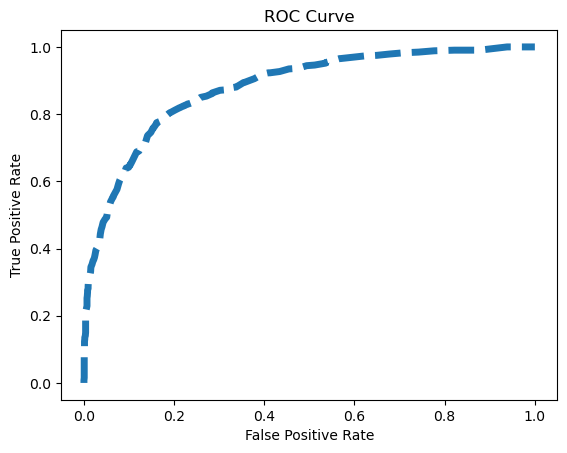

In [81]:
#Plotting ROC Curve
plt.plot(fpr,tpr,linewidth=5,linestyle="--")
plt.title("ROC Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()

# Saving the model

In [82]:
import joblib
joblib.dump(final_model,"Rain Tomorrow.pkl")

['Rain Tomorrow.pkl']

In [83]:
model=joblib.load("Rain Tomorrow.pkl")
pred=model.predict(x_test)
pred

array([0, 0, 0, ..., 0, 1, 0])

In [84]:
actual=np.array(y2_test)
actual

array([1, 0, 0, ..., 0, 1, 0])

In [85]:
ds=pd.DataFrame()
ds['Actual Value']=actual
ds['Predicted Value']=pred
ds.sample(10)

,Actual Value,Predicted Value
1247,0,0
1527,1,0
883,0,0
72,1,1
695,0,0
143,0,0
575,1,1
1687,0,0
107,0,0
478,0,0


# Modelling ("Rainfall")

In [86]:
x.head()

,Location,MinTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,RainToday
0,1,0.062237,0.110387,-0.053366,13,0.463334,13,14,0.860772,0.754321,0.186193,-1.564740,1.452768,0.063442,0
1,1,-1.023016,0.110387,-0.053366,14,0.463334,6,15,-0.912627,0.533938,-1.404255,-1.401063,0.069481,0.063442,0
2,1,-0.028201,0.110387,-0.053366,15,0.626293,13,15,0.749935,0.974704,-1.757688,-1.128268,0.069481,-1.012435,0
3,1,-0.697440,0.110387,-0.053366,4,-1.166250,9,0,-0.136765,-0.898550,-1.345350,-1.892095,0.069481,0.063442,0
4,1,0.803827,0.110387,-0.053366,13,0.218897,1,7,-0.580114,0.313555,0.834154,-0.964591,1.049874,1.566388,0


There are some columns which are unnecessary for measuring rainfall, lets drop them.

In [87]:
x.drop(['WindDir9am','WindDir3pm','WindSpeed9am','WindSpeed9am'],axis=1,inplace=True)

In [88]:
x.head()

,Location,MinTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindSpeed3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,RainToday
0,1,0.062237,0.110387,-0.053366,13,0.463334,0.754321,0.186193,-1.564740,1.452768,0.063442,0
1,1,-1.023016,0.110387,-0.053366,14,0.463334,0.533938,-1.404255,-1.401063,0.069481,0.063442,0
2,1,-0.028201,0.110387,-0.053366,15,0.626293,0.974704,-1.757688,-1.128268,0.069481,-1.012435,0
3,1,-0.697440,0.110387,-0.053366,4,-1.166250,-0.898550,-1.345350,-1.892095,0.069481,0.063442,0
4,1,0.803827,0.110387,-0.053366,13,0.218897,0.313555,0.834154,-0.964591,1.049874,1.566388,0


In [89]:
#importing the necessary algos
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor

In [90]:
#creating train_test_split
x_train,x_test,y1_train,y1_test=train_test_split(x,y1,test_size=0.20,random_state=42)

In [91]:
rfr=RandomForestRegressor()
rfr.fit(x_train,y1_train)
rfr_pred=rfr.predict(x_test)
print("Mean Absolute Error:",mean_absolute_error(y1_test,rfr_pred))
print("Mean Squared Error:",mean_squared_error(y1_test,rfr_pred))
print("R2 score :",r2_score(y1_test,rfr_pred))

Mean Absolute Error: 2.496911437027788
Mean Squared Error: 48.601256588235486
R2 score : 0.14021215042647894


In [92]:
ls=Lasso()
ls.fit(x_train,y1_train)
ls_pred=ls.predict(x_test)
print("Mean Absolute Error:",mean_absolute_error(y1_test,ls_pred))
print("Mean Squared Error:",mean_squared_error(y1_test,ls_pred))
print("R2 score :",r2_score(y1_test,ls_pred))

Mean Absolute Error: 2.8292489313266196
Mean Squared Error: 40.821804538504196
R2 score : 0.2778357185857816


In [93]:
knn=KNeighborsRegressor()
knn.fit(x_train,y1_train)
knn_pred=knn.predict(x_test)
print("Mean Absolute Error:",mean_absolute_error(y1_test,knn_pred))
print("Mean Squared Error:",mean_squared_error(y1_test,knn_pred))
print("R2 score :",r2_score(y1_test,knn_pred))

Mean Absolute Error: 2.635937054159889
Mean Squared Error: 47.54395216099887
R2 score : 0.1589165536385222


In [94]:
dtr=DecisionTreeRegressor()
dtr.fit(x_train,y1_train)
dtr_pred=dtr.predict(x_test)
print("Mean Absolute Error:",mean_absolute_error(y1_test,dtr_pred))
print("Mean Squared Error:",mean_squared_error(y1_test,dtr_pred))
print("R2 score :",r2_score(y1_test,dtr_pred))

Mean Absolute Error: 3.366160464583677
Mean Squared Error: 200.9015530162533
R2 score : -2.5540791816818413


# Cross_Validation

In [95]:
#finding the best k-fold
for i in range(2,25):
    score=cross_val_score(rfr,x,y1,cv=i)
    print("At k-fold",i,"cv score is",score.mean())
    print("The accuracy is",r2_score(y1_test,rfr_pred))
    print("\n")

At k-fold 2 cv score is 0.13610216900045302
The accuracy is 0.14021215042647894


At k-fold 3 cv score is 0.10826169159483379
The accuracy is 0.14021215042647894


At k-fold 4 cv score is 0.14853505817494916
The accuracy is 0.14021215042647894


At k-fold 5 cv score is 0.21862119890598608
The accuracy is 0.14021215042647894


At k-fold 6 cv score is -0.011349980972124252
The accuracy is 0.14021215042647894


At k-fold 7 cv score is -0.42045640474358803
The accuracy is 0.14021215042647894


At k-fold 8 cv score is 0.05592830091851275
The accuracy is 0.14021215042647894


At k-fold 9 cv score is 0.024433470198344423
The accuracy is 0.14021215042647894


At k-fold 10 cv score is 0.10664612691330659
The accuracy is 0.14021215042647894


At k-fold 11 cv score is 0.034617477730788764
The accuracy is 0.14021215042647894


At k-fold 12 cv score is 0.11833293868568791
The accuracy is 0.14021215042647894


At k-fold 13 cv score is 0.13618623590942125
The accuracy is 0.14021215042647894


At k-fo

In [96]:
dtr_score=cross_val_score(dtr,x,y1,cv=5)
print(dtr_score)
print(dtr_score.mean())
print("The difference between r2 score and cv score is:",(r2_score(y1_test,dtr_pred))-(dtr_score.mean()))

[-0.12632144  0.11143092 -3.19474496 -1.59384832 -4.2677655 ]
-1.8142498618374046
The difference between r2 score and cv score is: -0.7398293198444368


In [97]:
rfr_score=cross_val_score(rfr,x,y1,cv=5)
print(rfr_score)
print(rfr_score.mean())
print("The difference between r2 score and cv score is:",(r2_score(y1_test,rfr_pred))-(rfr_score.mean()))

[0.1977158  0.14268776 0.18905169 0.11510818 0.43374999]
0.2156626846230684
The difference between r2 score and cv score is: -0.07545053419658945


In [98]:
knn_score=cross_val_score(knn,x,y1,cv=5)
print(knn_score)
print(knn_score.mean())
print("The difference between r2 score and cv score is:",(r2_score(y1_test,knn_pred))-(knn_score.mean()))

[ 0.07950737  0.04733247  0.06837365  0.13200651 -0.20245752]
0.024952496199838126
The difference between r2 score and cv score is: 0.13396405743868406


# Hyper_Parameter_Tuning

In [99]:
model=KNeighborsRegressor()
parameters={'n_neighbors':[6,7,10,12,15,3,8,11],'weights':['uniform','distance']}
grid=GridSearchCV(estimator=model,param_grid=parameters)
grid.fit(x,y1)
print("GRID :",grid)
print("SCORE =",grid.best_score_)
print("PARAMS =",grid.best_params_)

GRID : GridSearchCV(estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': [6, 7, 10, 12, 15, 3, 8, 11],
                         'weights': ['uniform', 'distance']})
SCORE = 0.09598420456590155
PARAMS = {'n_neighbors': 15, 'weights': 'distance'}


In [100]:
#Applying the parameter
knn=KNeighborsRegressor(n_neighbors=15,weights='distance')
knn.fit(x_train,y1_train)
pred=knn.predict(x_test)
print("R2 score =",r2_score(y1_test,pred))

R2 score = 0.2840585653909806


In [101]:
model=DecisionTreeRegressor()
parameters={'criterion':['squared_error','friedman_mse','absolute_error','poisson'],'splitter':['best','random']}
grid=GridSearchCV(estimator=model,param_grid=parameters)
grid.fit(x,y1)
print("GRID :",grid)
print("SCORE =",grid.best_score_)
print("PARAMS =",grid.best_params_)

GRID : GridSearchCV(estimator=DecisionTreeRegressor(),
             param_grid={'criterion': ['squared_error', 'friedman_mse',
                                       'absolute_error', 'poisson'],
                         'splitter': ['best', 'random']})
SCORE = -0.6234555689923738
PARAMS = {'criterion': 'absolute_error', 'splitter': 'random'}


In [103]:
#Applying the parameter
dtr=DecisionTreeRegressor(criterion='absolute_error',splitter='random')
dtr.fit(x_train,y1_train)
pred=dtr.predict(x_test)
print("R2 score =",r2_score(y1_test,pred))

R2 score = -1.9956790549111156


In [ ]:
model=RandomForestRegressor()
parameters={'n_estimators':[100,110,130,189,210],'criterion':['squared_error','friedman_mse','absolute_error','poisson']}
grid=GridSearchCV(estimator=model,param_grid=parameters)
grid.fit(x,y1)
print("GRID :",grid)
print("SCORE =",grid.best_score_)
print("PARAMS =",grid.best_params_)

In [104]:
#Applying the parameters
rfr=RandomForestRegressor(n_estimators=130,criterion='absolute_error')
rfr.fit(x_train,y1_train)
pred=rfr.predict(x_test)
print("R2 score =",r2_score(y1_test,pred))

R2 score = 0.1940235894993576


In [107]:
model=Lasso()
parameters={'alpha':[0,0.1,0.01,0.001,1],'max_iter':[500,1000,1200,1500,1400]}
grid=GridSearchCV(estimator=model, param_grid=parameters)
grid.fit(x_train,y1_train)
print("GRID :",grid)
print("SCORE =",grid.best_score_)
print("PARAMS =",grid.best_params_)

GRID : GridSearchCV(estimator=Lasso(),
             param_grid={'alpha': [0, 0.1, 0.01, 0.001, 1],
                         'max_iter': [500, 1000, 1200, 1500, 1400]})
SCORE = 0.2391358020735339
PARAMS = {'alpha': 0.01, 'max_iter': 500}


In [110]:
#Applying the parameter
ls=Lasso(alpha=0.01,max_iter=500)
ls.fit(x_train,y1_train)
pred=ls.predict(x_test)
print("R2 Score =",r2_score(y1_test,pred))

R2 Score = 0.34621832006426867


In [108]:
model=Ridge()
parameters={'alpha':[0,0.1,0.001,0.0001,1],'max_iter':[250,500,1000,1500,15000,12000]}
grid=GridSearchCV(estimator=model, param_grid=parameters)
grid.fit(x_train,y1_train)
print("GRID :",grid)
print("SCORE =",grid.best_score_)
print("PARAMS =",grid.best_params_)

GRID : GridSearchCV(estimator=Ridge(),
             param_grid={'alpha': [0, 0.1, 0.001, 0.0001, 1],
                         'max_iter': [250, 500, 1000, 1500, 15000, 12000]})
SCORE = 0.23901009532867762
PARAMS = {'alpha': 1, 'max_iter': 250}


In [111]:
#Applying the parameters
rd=Ridge(alpha=1,max_iter=250)
rd.fit(x_train,y1_train)
pred=rd.predict(x_test)
print("R2 score =",r2_score(y1_test,pred))

R2 score = 0.34546208337101947


From all the models Lasso is giving the highest accuracy.

In [112]:
final_model=ls
final_model

Lasso(alpha=0.01, max_iter=500)

# Saving and Predicting

In [113]:
import joblib
joblib.dump(final_model,"Rainfall.pkl")

['Rainfall.pkl']

In [114]:
model=joblib.load("Rainfall.pkl")
pred=model.predict(x_test)

In [115]:
actual=np.array(y1_test)
actual

array([0.        , 0.        , 0.        , ..., 0.        , 2.80591326,
       1.2       ])

In [120]:
ds=pd.DataFrame()
ds['Actual']=actual
ds['Predicted_Value']=pred
ds.sample(5)

,Actual,Predicted_Value
306,0.0,1.110843
1064,0.0,-2.163237
1175,0.0,0.083067
927,16.2,13.847347
1191,0.2,4.578834
